In [3]:
import numpy as np
from matplotlib import pyplot as plt
import SimpleITK as sitk
import pickle as pkl
import torch
import cv2
from img_utils import flip_img, get_slice_at, visualize_body, getVesselBox, to_grayscale, getTargetBox, draw_us_box
from slice_matching import local_match,global_match
from evaluation import segmentation_scores
import sys
sys.path.append("../../")

from scripts.USImageCV.utils.bunny import bunny_mask_predict, load_bunny_model
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Segmentation metric definitions

In what follows, $Y$ and $\tilde{Y}$ are binary matrices with the same size. Define $|Y|$ as the L1 norm of $Y$, which is the same as the number of non-zero entries in $Y$. Define $Y\cap \tilde{Y}$ as the matrix resulting from entrywise and-operation between $Y$ and $\tilde{Y}$.

Let $\tilde{Y}$ be the ground truth IVC pixels in the expected field of view. Let $Y$ be the detected IVC pixels in the actual field of view.

**Precision**$= \frac{|\tilde{Y}\cap Y|}{|Y|}$. 
**Recall**$= \frac{|\tilde{Y}\cap Y|}{|\tilde{Y}|}$.
**Dice Score**$= \frac{2|\tilde{Y}\cap Y|}{|Y|+|\tilde{Y}|}$.   

Let a translation map $t$ acting on $Y$ as an operation defined as follows: the map $t$ is parametrized by two integer numbers $x_t, y_t$. $X=t(Y)$ is a matrix that has the same dimensions as $Y$, where each entry $X_{ij}$ of $X$ is mapped either to $0$ or to an entry $Y_{kq} in $Y$, the exact formula being

$$
    \begin{bmatrix}k\\q\end{bmatrix} = 
    \begin{bmatrix}
            1 & 0 & x_t\\
            0 & 1 & y_t 
    \end{bmatrix} \begin{bmatrix}i\\j\end{bmatrix},\text{if the right hand size is within the dimensions of $Y$, and $0$ otherwise.}
$$

Let $T(Y)=\{X: X= t(Y) \text{ for some translation map }t\}$ be the set of all possible translated versions of $Y$. Define the optimal moving window version of precision, recall, and Dice score as

**Opt Moving Precision**$= \max_{X \in T(Y)}\frac{|\tilde{Y}\cap X|}{|Y|}$. 

**Opt Moving Recall**$= \max_{X \in T(Y)}\frac{|\tilde{Y}\cap X|}{|\tilde{Y}|}$.

**Opt Moving Dice Score**$= \max_{X \in T(Y)} \frac{2|\tilde{Y}\cap X|}{|Y|+|\tilde{Y}|}$.   

Note that the denominators have $|Y|$ rather than $|X|$ for stability.

The quantity $\max_{X \in T(Y)} |\tilde{Y}\cap X|$ can be calculated by convolving $Y$ over $\tilde{Y}$.

In [5]:
with open('us_observations_2.pkl','rb') as fp:
    data = pkl.load(fp)
target_locs = data['CT_target_locs']
frames = data['frame']
body_ct = sitk.ReadImage('./nifty/CT_phantom_regular.nii.gz')
body_ct = flip_img(body_ct,[True,False,False])
vessel_ct = sitk.ReadImage('./nifty/vessel_ct.nii.gz')
vessel_ct = flip_img(vessel_ct,[True,False,False])

In [6]:
import yaml
with open('../../config/us_spacing.yaml') as fp:
    sp = yaml.safe_load(fp)

# Spacing Units are mm.
xspacing = sp['xspacing'] 
yspacing = sp['yspacing']

In [7]:

device = 'cuda' if torch.cuda.is_available() else 'cpu'

vessel_model = load_bunny_model('../../scripts/USImageCV/model_weights/vessel_model.pth',device)

<Figure size 1500x600 with 0 Axes>

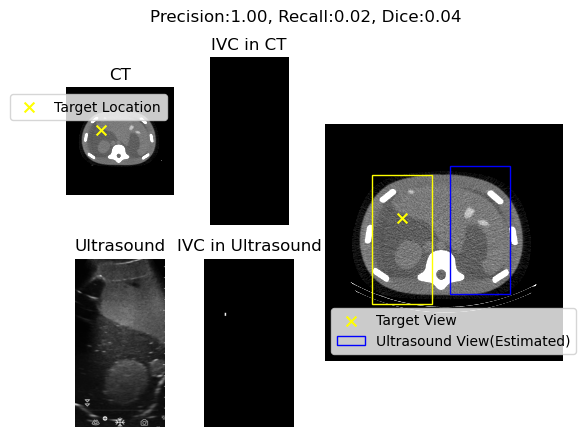

/Users/tianpengzhang/Dropbox (Harvard University)/Tianpeng's research/Robotics Lab/Robotic Ultrasound/robotic-ultrasound/notebooks/UltrasoundNavigation/evaluation.py:13: RuntimeWarning: divide by zero encountered in scalar divide
  opt_mov_precision = am / Y


<Figure size 1500x600 with 0 Axes>

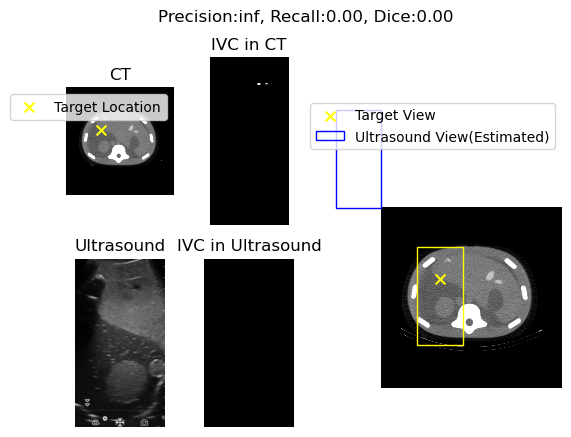

<Figure size 1500x600 with 0 Axes>

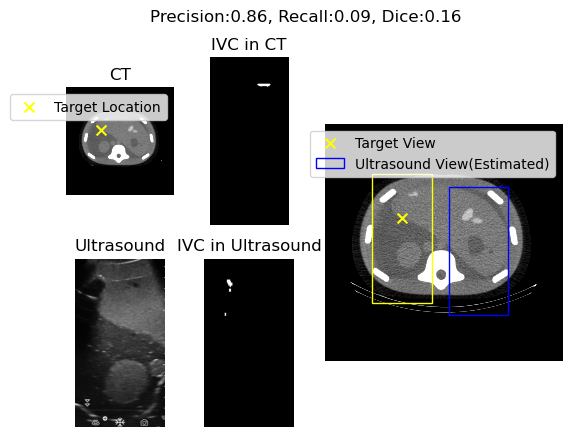

<Figure size 1500x600 with 0 Axes>

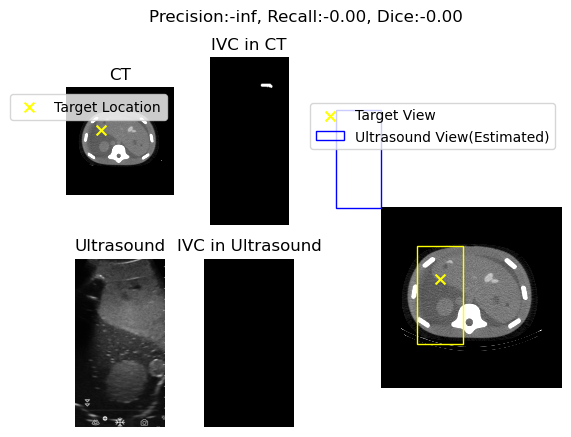

<Figure size 1500x600 with 0 Axes>

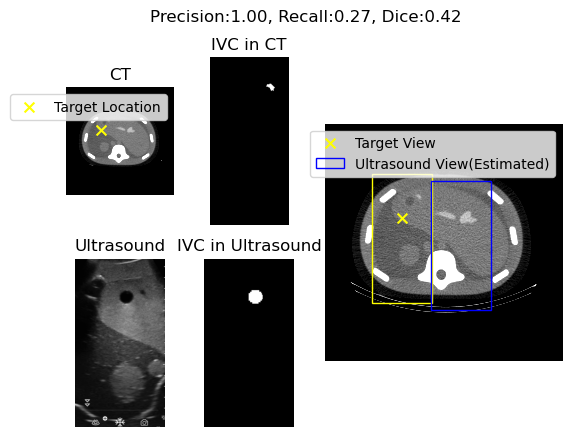

<Figure size 1500x600 with 0 Axes>

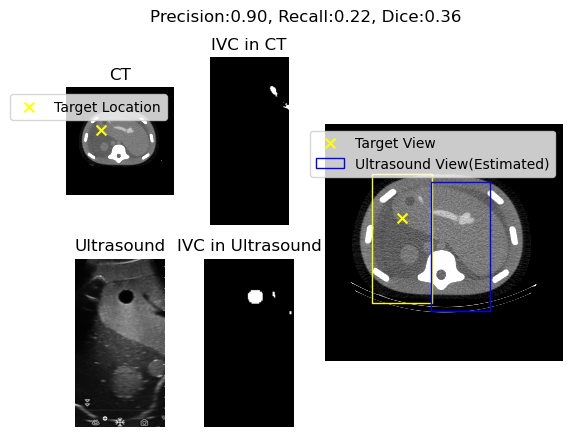

<Figure size 1500x600 with 0 Axes>

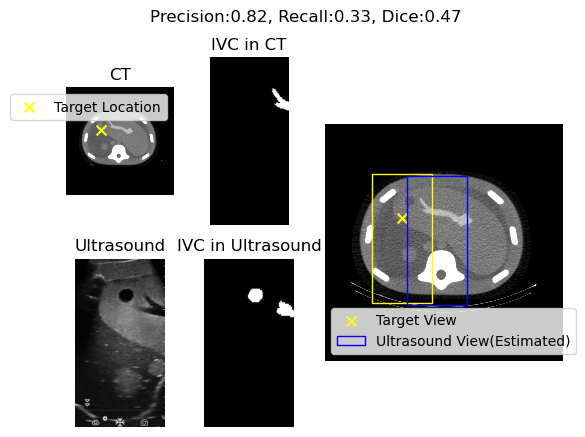

<Figure size 1500x600 with 0 Axes>

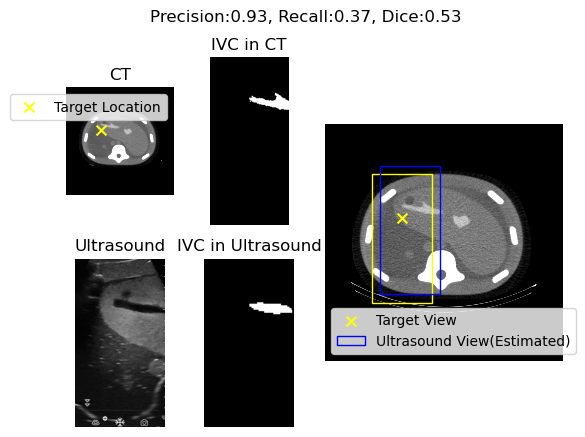

<Figure size 1500x600 with 0 Axes>

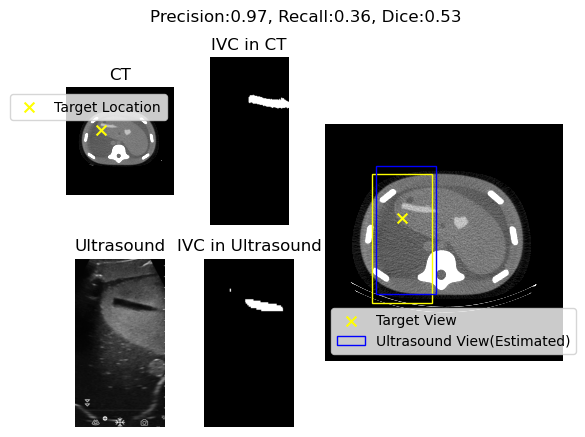

<Figure size 1500x600 with 0 Axes>

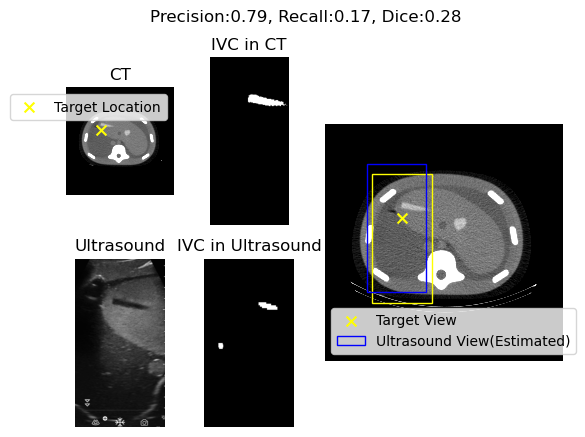

<Figure size 1500x600 with 0 Axes>

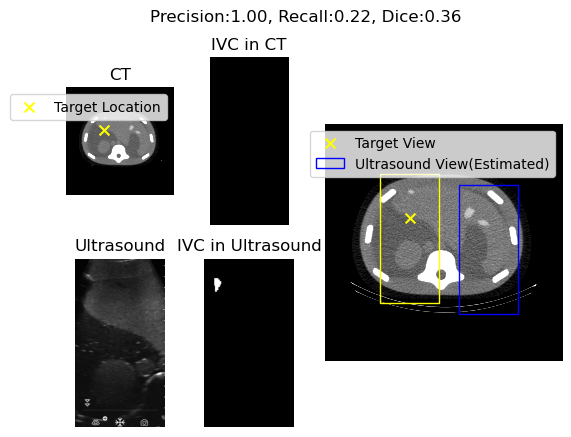

<Figure size 1500x600 with 0 Axes>

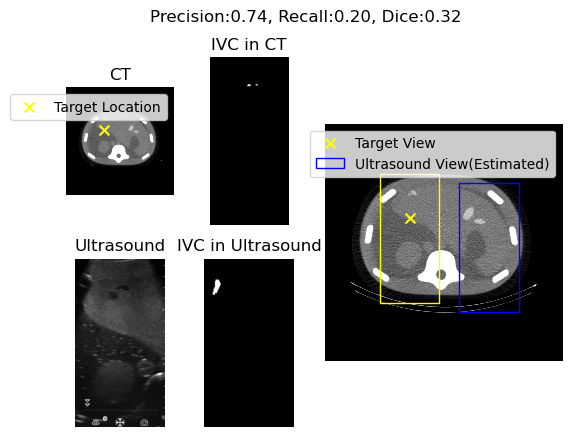

<Figure size 1500x600 with 0 Axes>

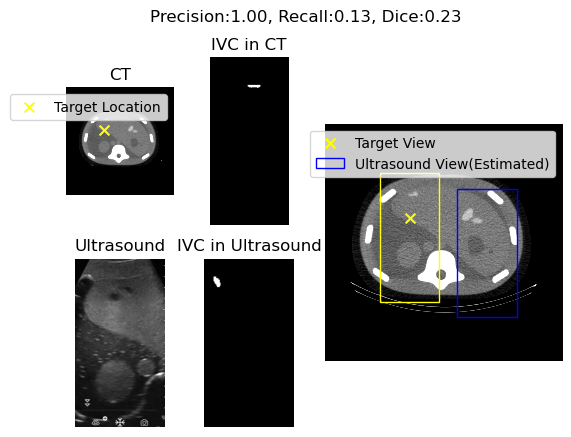

<Figure size 1500x600 with 0 Axes>

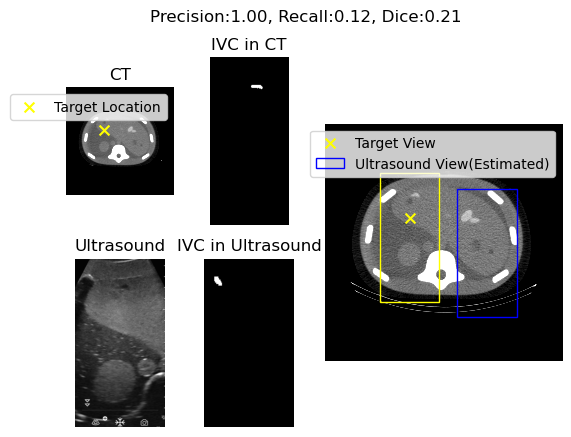

<Figure size 1500x600 with 0 Axes>

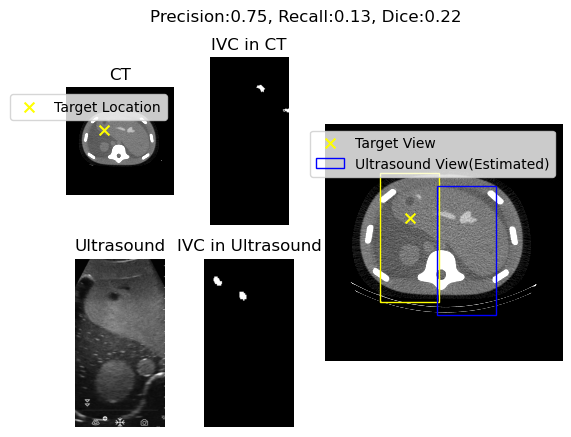

<Figure size 1500x600 with 0 Axes>

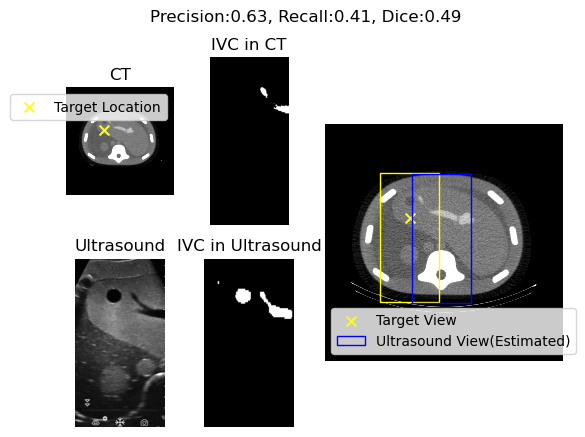

<Figure size 1500x600 with 0 Axes>

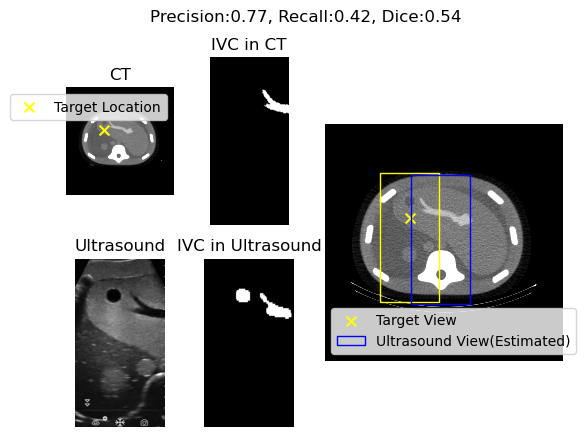

<Figure size 1500x600 with 0 Axes>

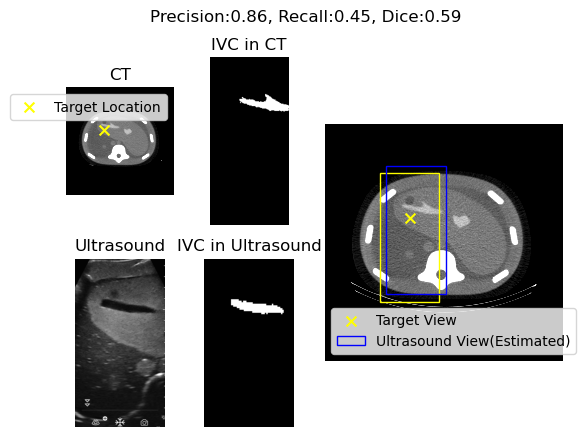

<Figure size 1500x600 with 0 Axes>

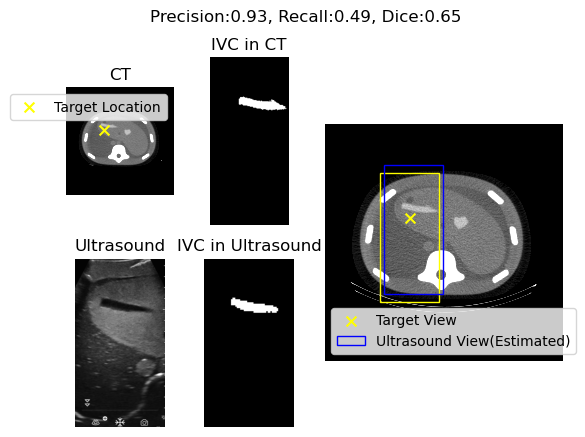

<Figure size 1500x600 with 0 Axes>

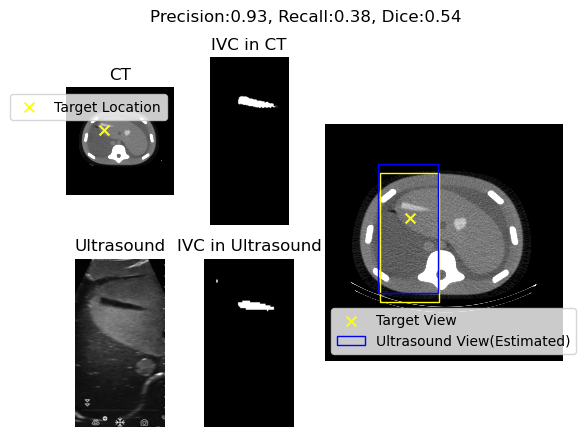

<Figure size 1500x600 with 0 Axes>

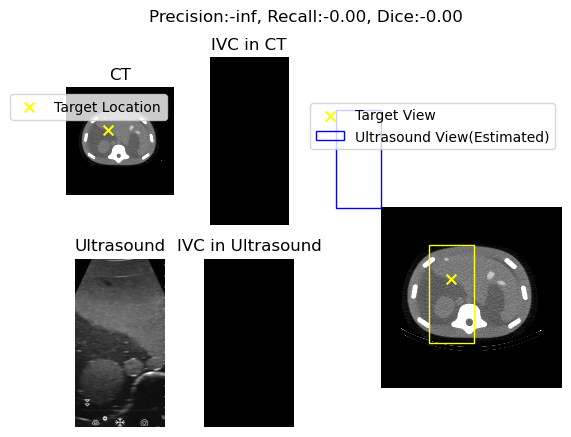

<Figure size 1500x600 with 0 Axes>

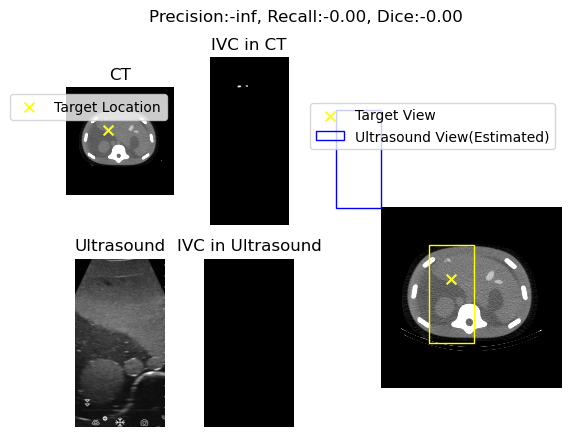

<Figure size 1500x600 with 0 Axes>

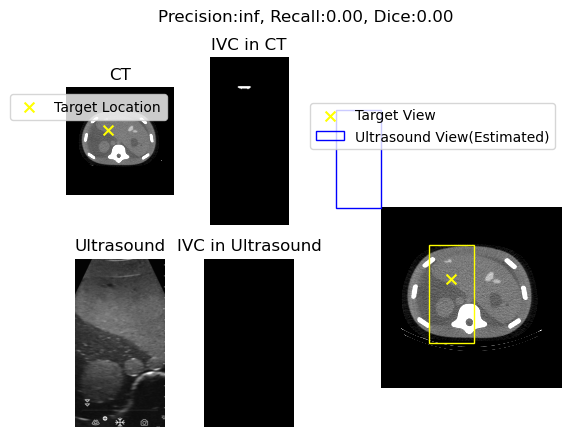

<Figure size 1500x600 with 0 Axes>

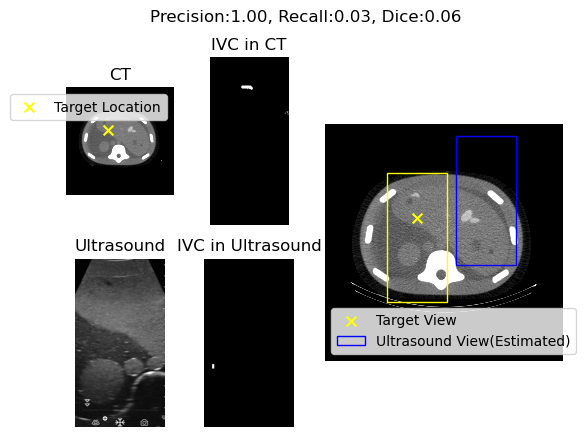

<Figure size 1500x600 with 0 Axes>

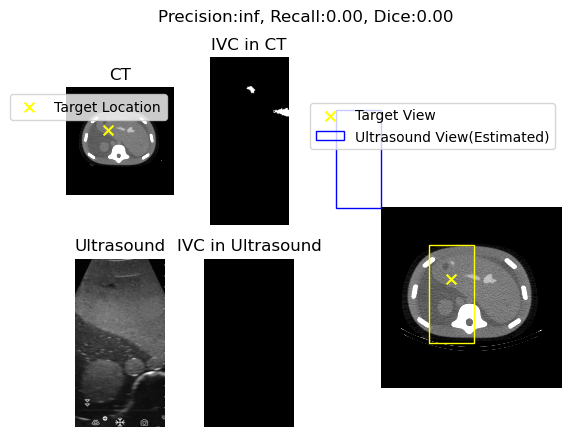

<Figure size 1500x600 with 0 Axes>

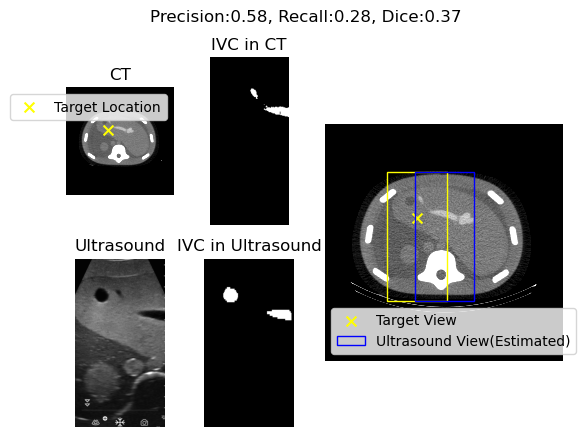

<Figure size 1500x600 with 0 Axes>

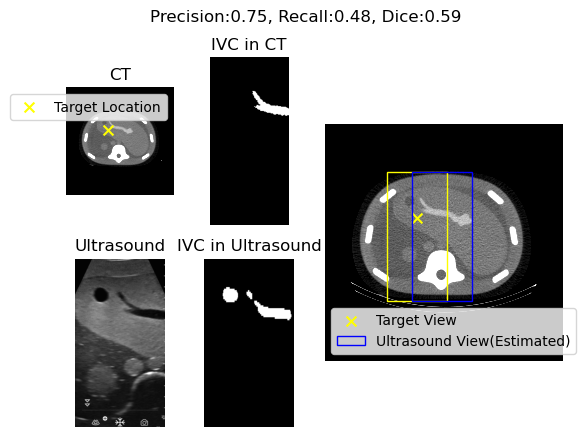

<Figure size 1500x600 with 0 Axes>

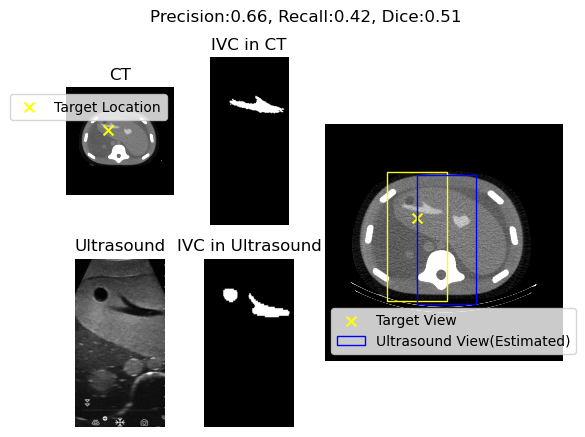

<Figure size 1500x600 with 0 Axes>

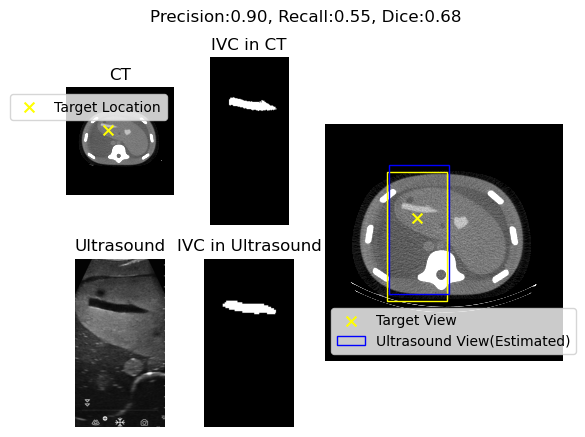

<Figure size 1500x600 with 0 Axes>

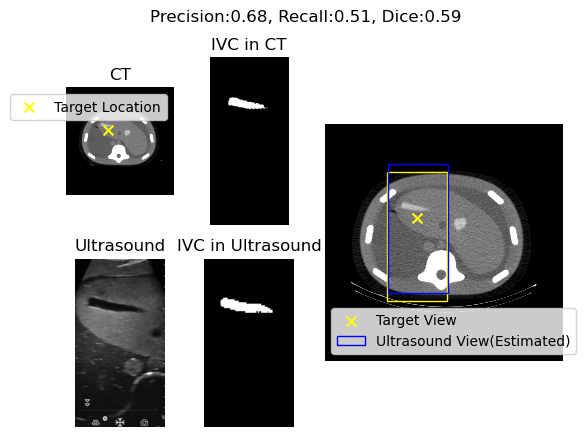

<Figure size 1500x600 with 0 Axes>

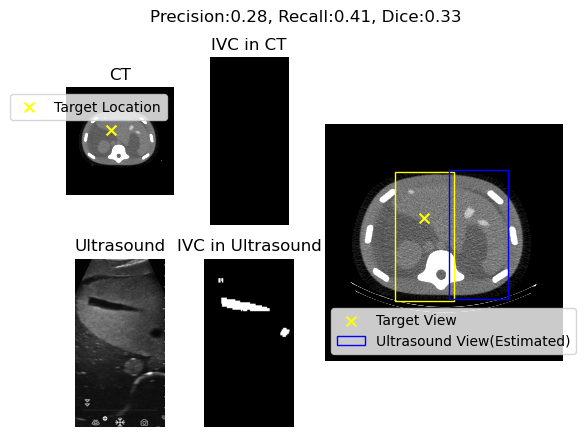

<Figure size 1500x600 with 0 Axes>

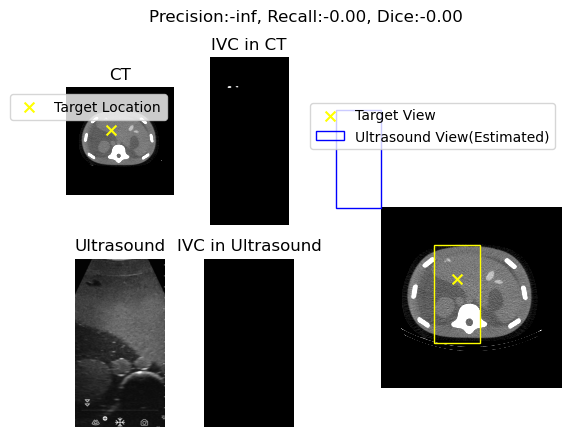

<Figure size 1500x600 with 0 Axes>

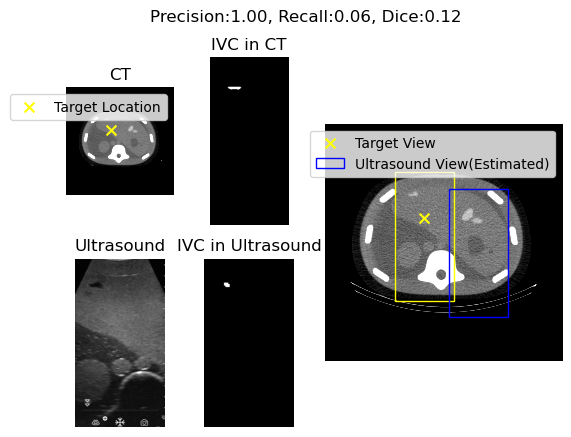

<Figure size 1500x600 with 0 Axes>

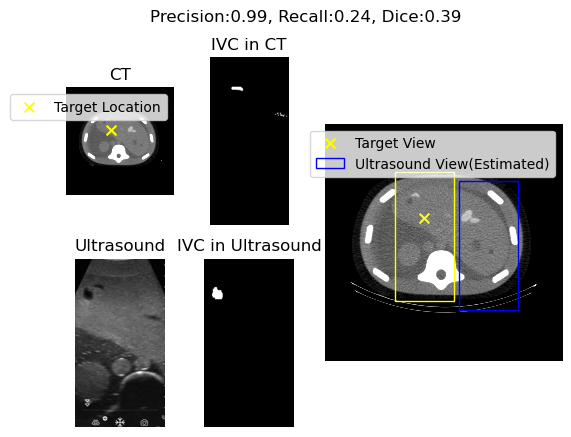

<Figure size 1500x600 with 0 Axes>

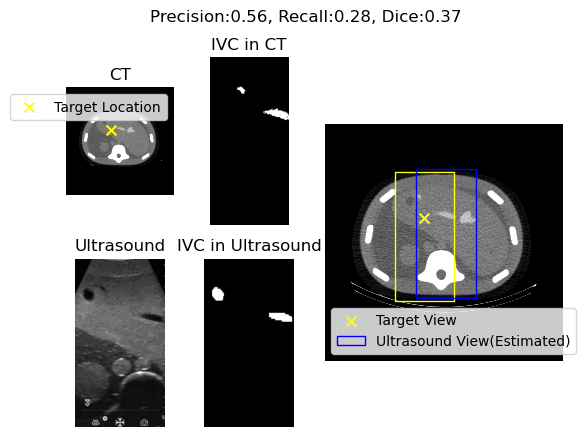

<Figure size 1500x600 with 0 Axes>

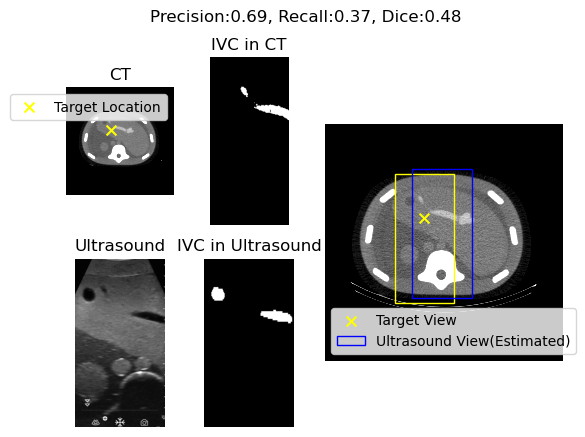

<Figure size 1500x600 with 0 Axes>

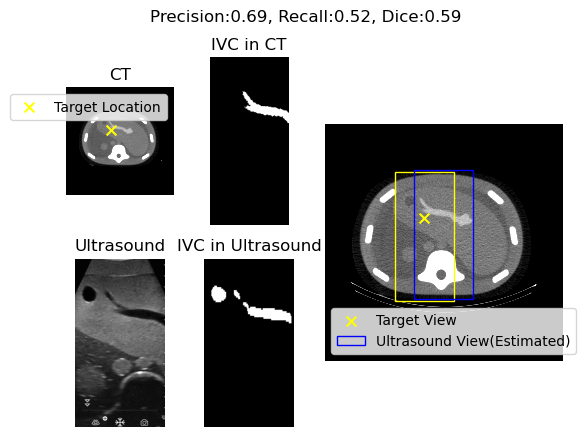

<Figure size 1500x600 with 0 Axes>

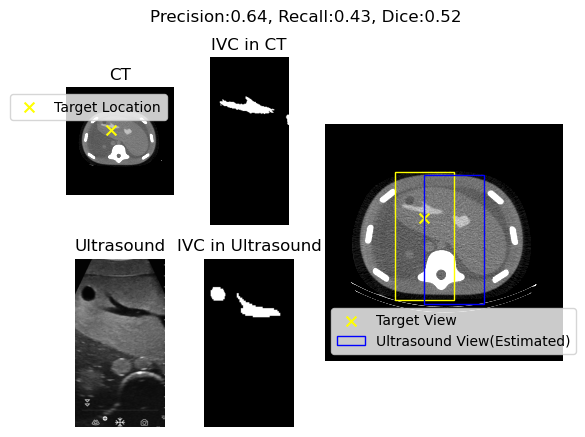

<Figure size 1500x600 with 0 Axes>

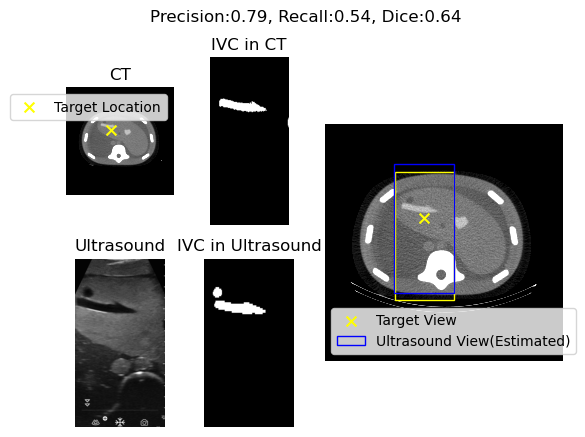

<Figure size 1500x600 with 0 Axes>

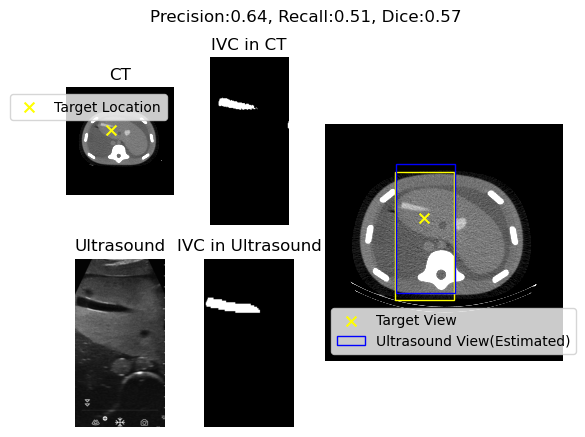

<Figure size 1500x600 with 0 Axes>

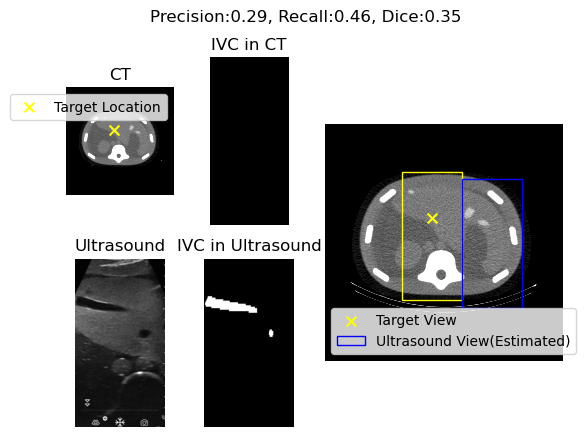

<Figure size 1500x600 with 0 Axes>

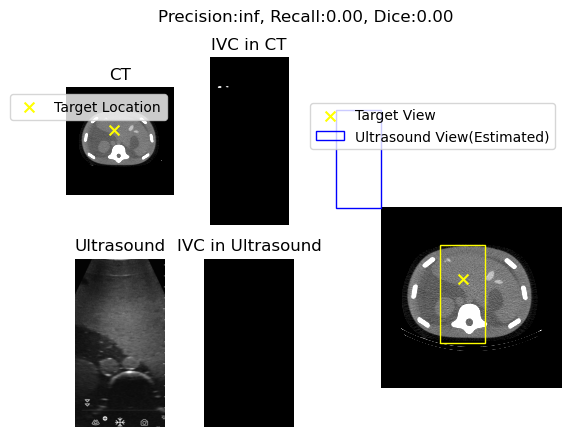

<Figure size 1500x600 with 0 Axes>

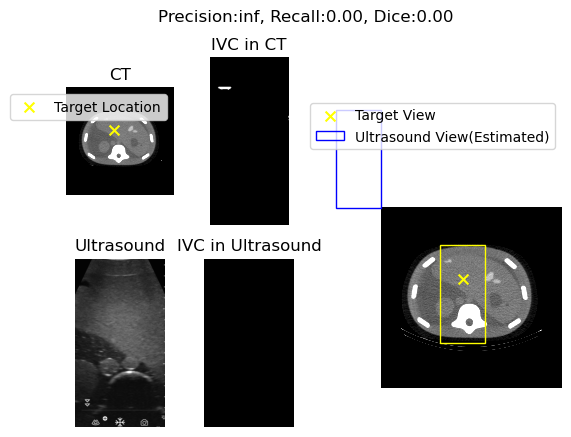

<Figure size 1500x600 with 0 Axes>

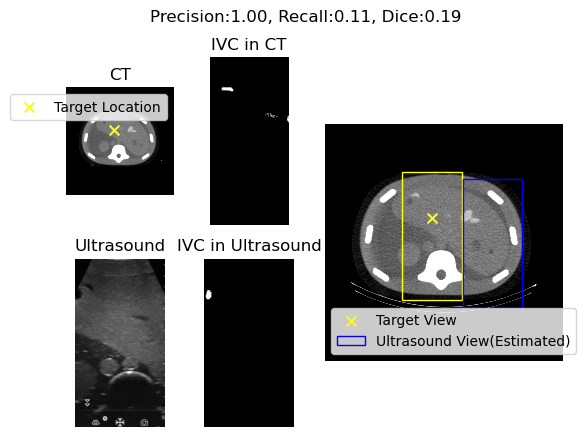

<Figure size 1500x600 with 0 Axes>

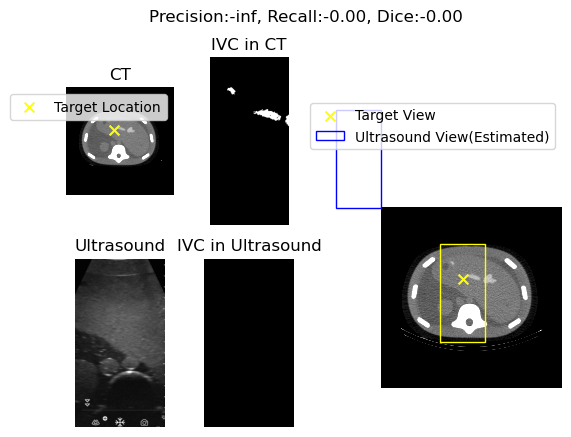

<Figure size 1500x600 with 0 Axes>

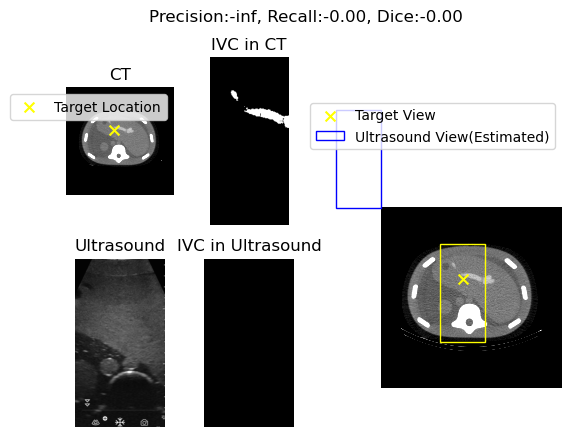

<Figure size 1500x600 with 0 Axes>

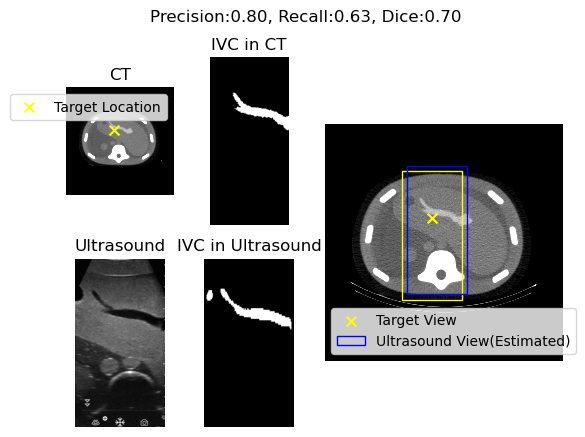

<Figure size 1500x600 with 0 Axes>

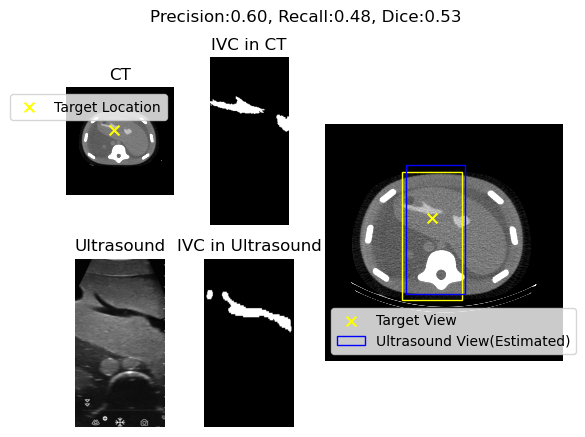

<Figure size 1500x600 with 0 Axes>

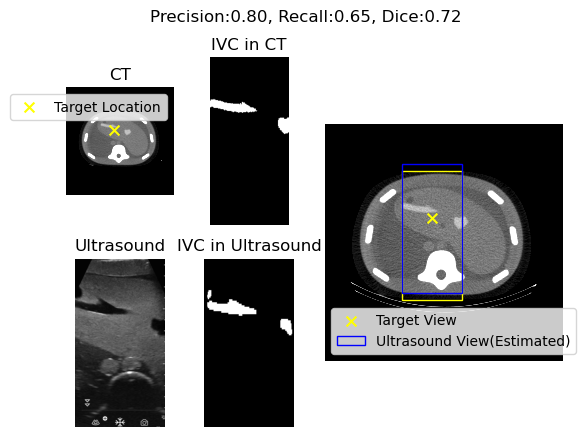

<Figure size 1500x600 with 0 Axes>

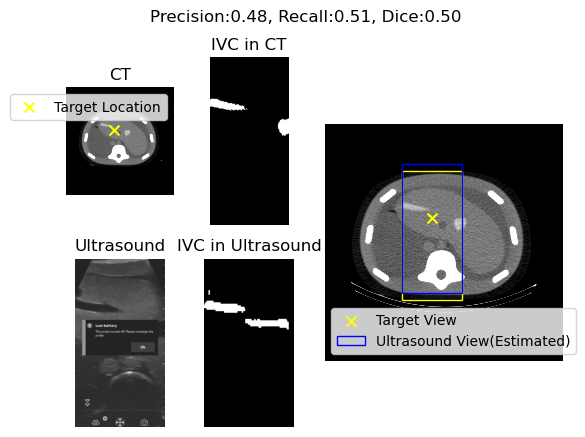

<Figure size 1500x600 with 0 Axes>

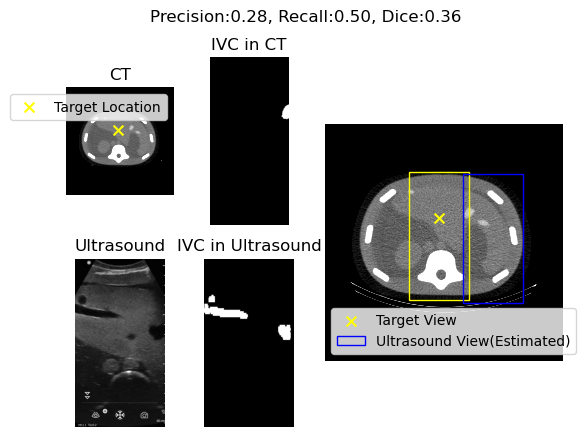

<Figure size 1500x600 with 0 Axes>

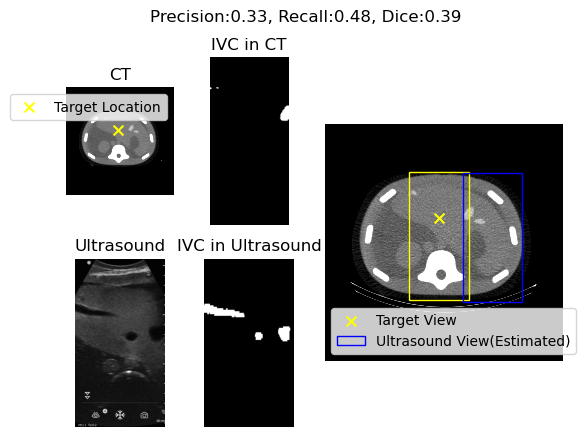

<Figure size 1500x600 with 0 Axes>

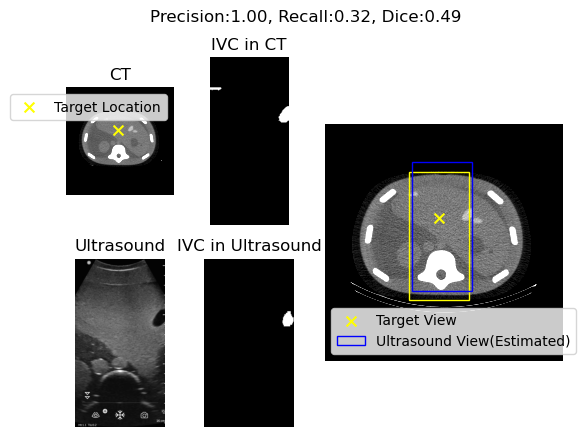

<Figure size 1500x600 with 0 Axes>

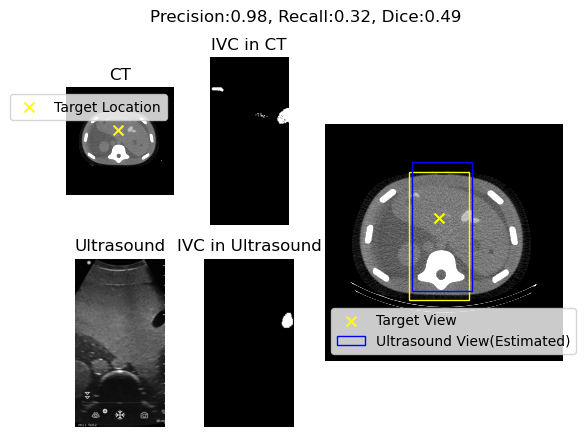

<Figure size 1500x600 with 0 Axes>

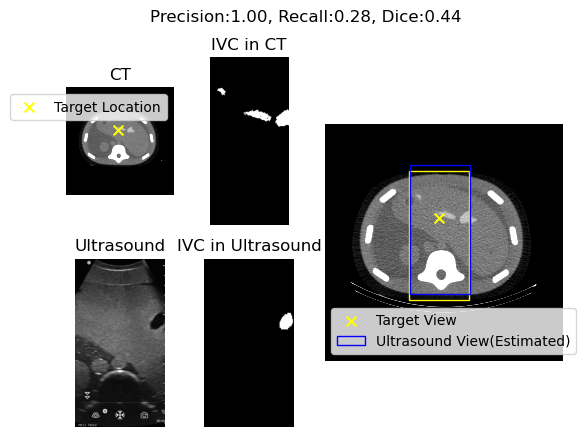

<Figure size 1500x600 with 0 Axes>

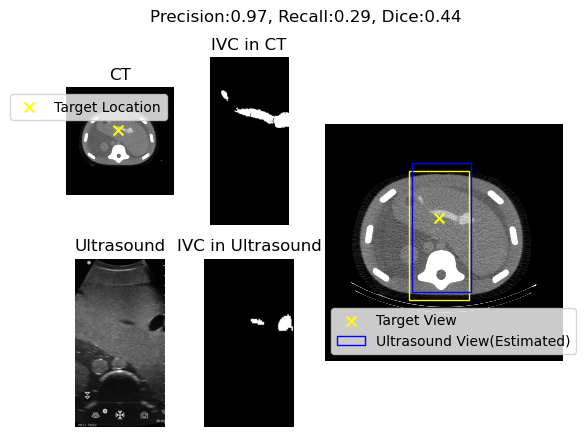

<Figure size 1500x600 with 0 Axes>

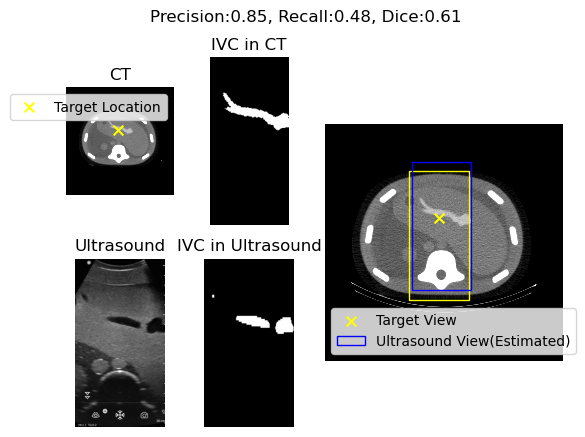

<Figure size 1500x600 with 0 Axes>

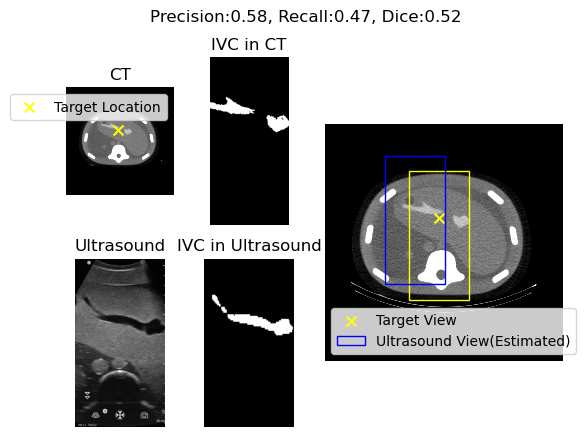

<Figure size 1500x600 with 0 Axes>

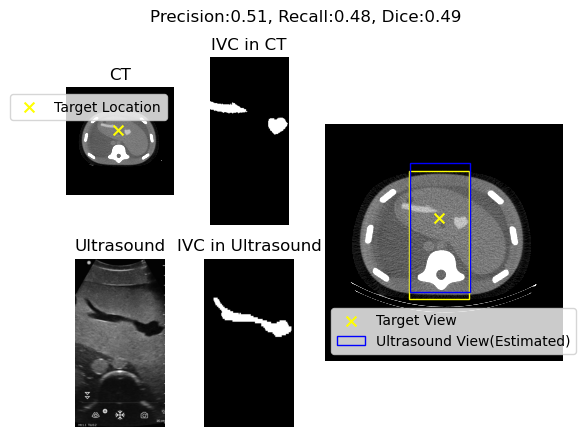

<Figure size 1500x600 with 0 Axes>

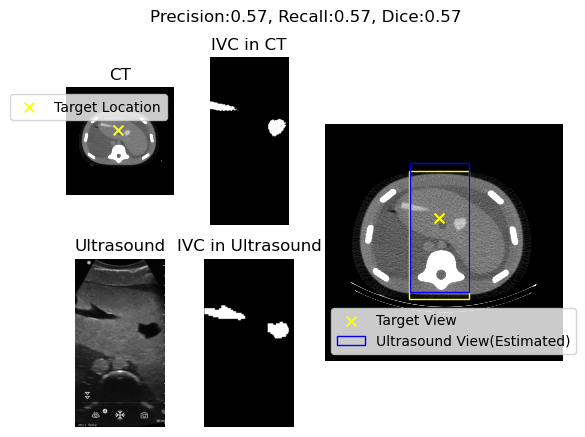

<Figure size 1500x600 with 0 Axes>

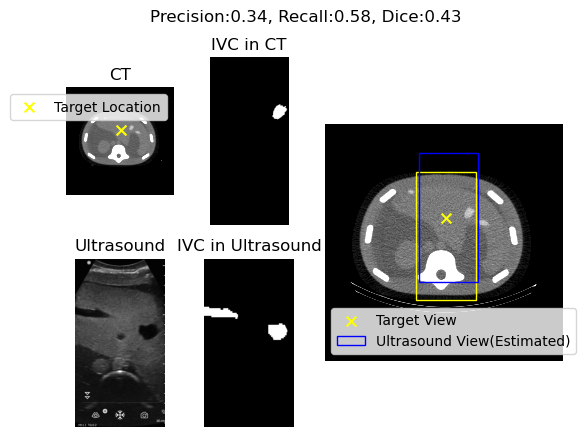

<Figure size 1500x600 with 0 Axes>

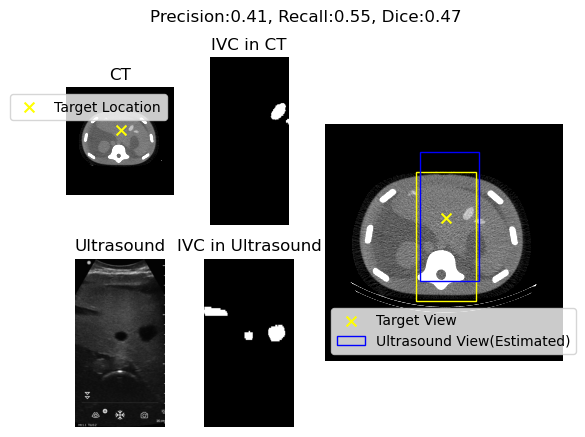

<Figure size 1500x600 with 0 Axes>

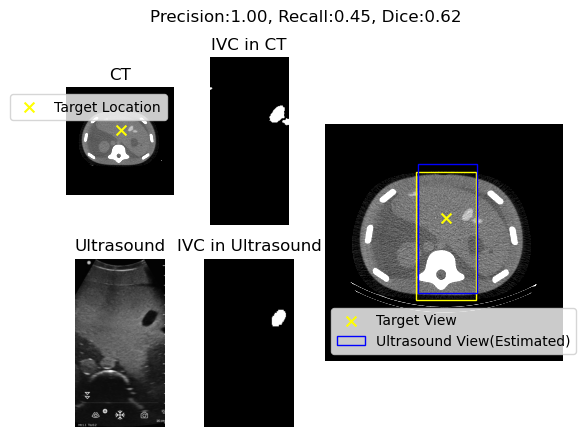

<Figure size 1500x600 with 0 Axes>

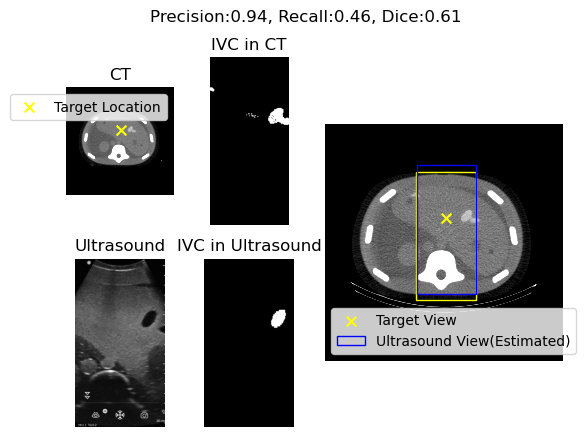

<Figure size 1500x600 with 0 Axes>

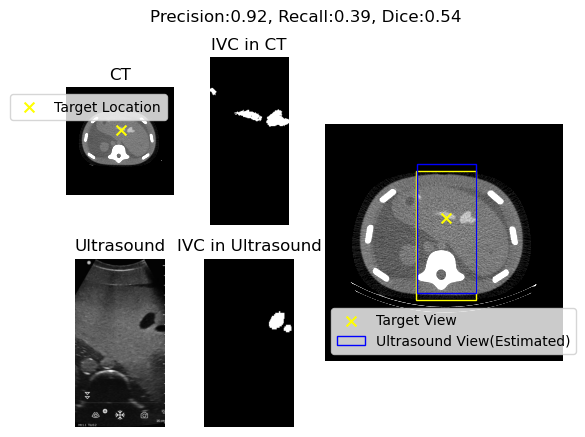

<Figure size 1500x600 with 0 Axes>

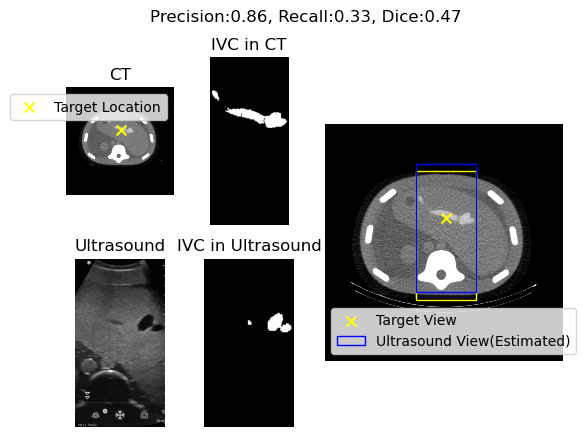

<Figure size 1500x600 with 0 Axes>

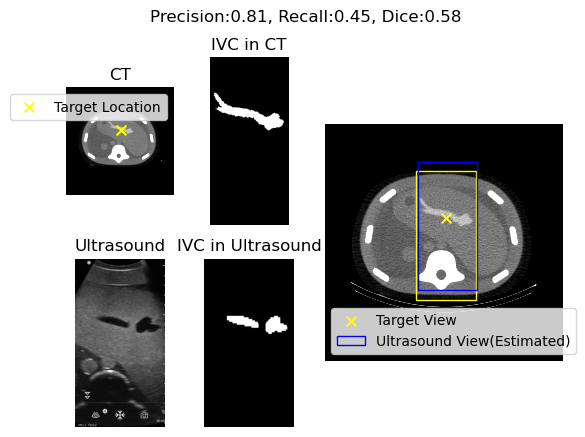

<Figure size 1500x600 with 0 Axes>

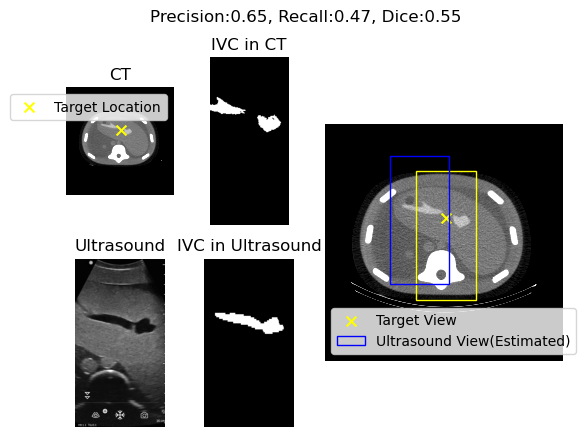

<Figure size 1500x600 with 0 Axes>

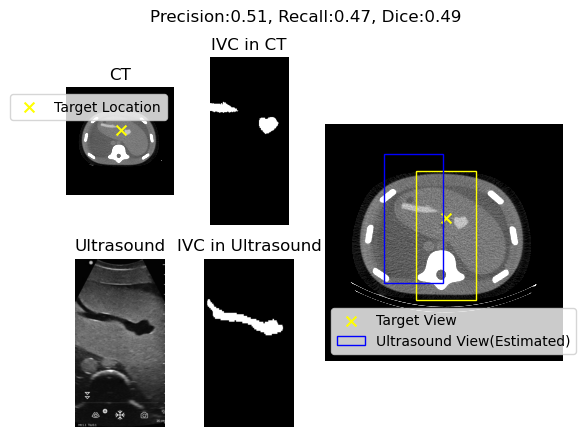

<Figure size 1500x600 with 0 Axes>

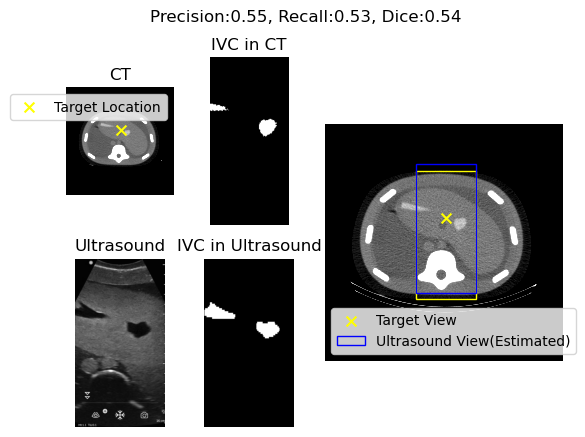

<Figure size 1500x600 with 0 Axes>

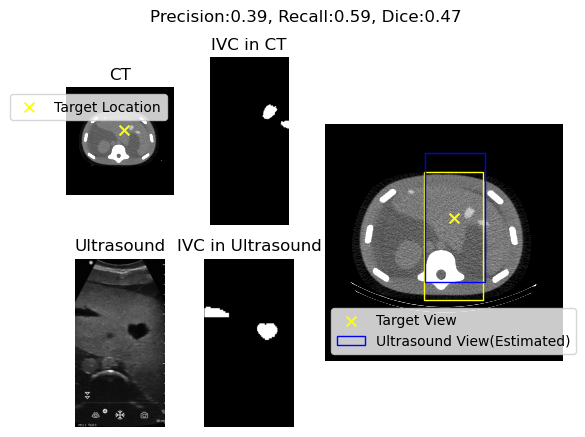

<Figure size 1500x600 with 0 Axes>

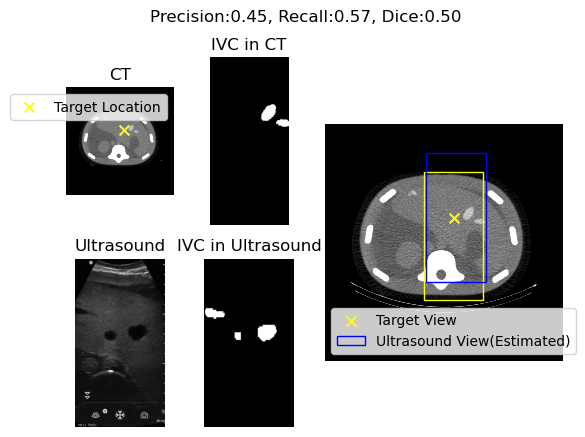

<Figure size 1500x600 with 0 Axes>

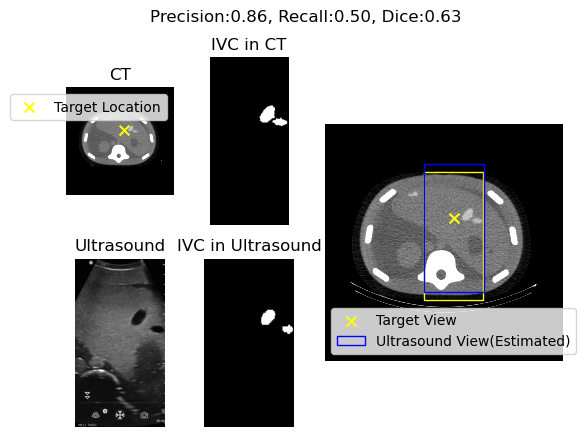

<Figure size 1500x600 with 0 Axes>

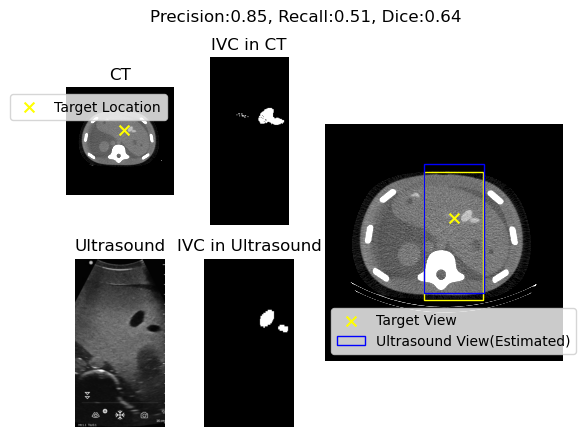

<Figure size 1500x600 with 0 Axes>

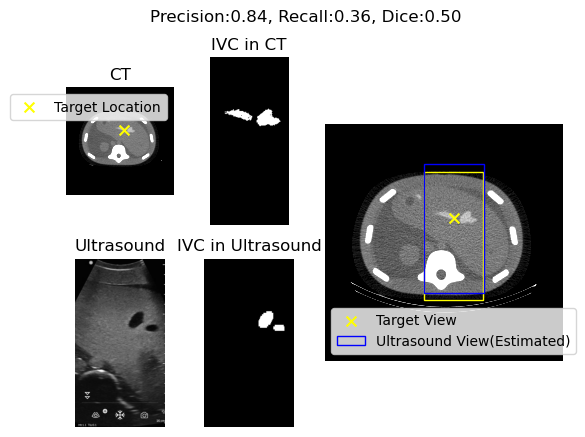

<Figure size 1500x600 with 0 Axes>

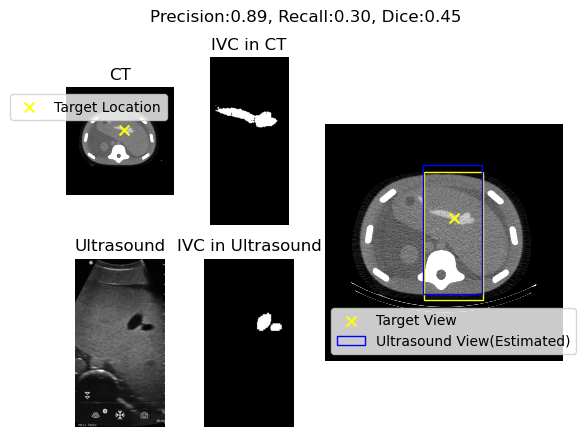

<Figure size 1500x600 with 0 Axes>

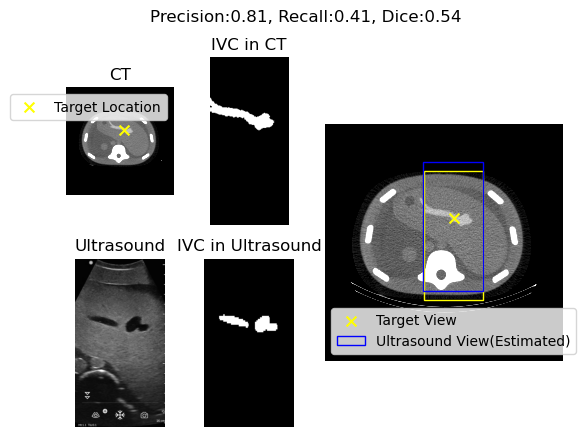

<Figure size 1500x600 with 0 Axes>

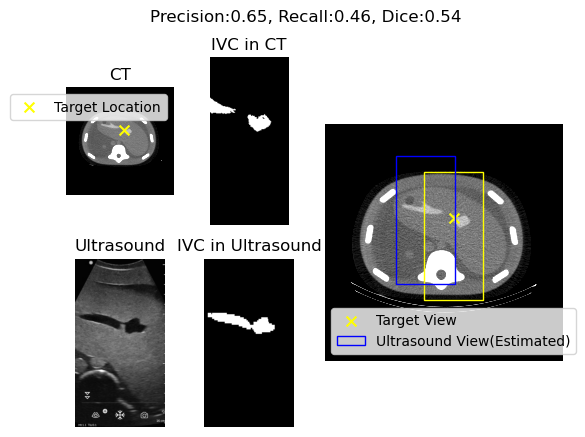

<Figure size 1500x600 with 0 Axes>

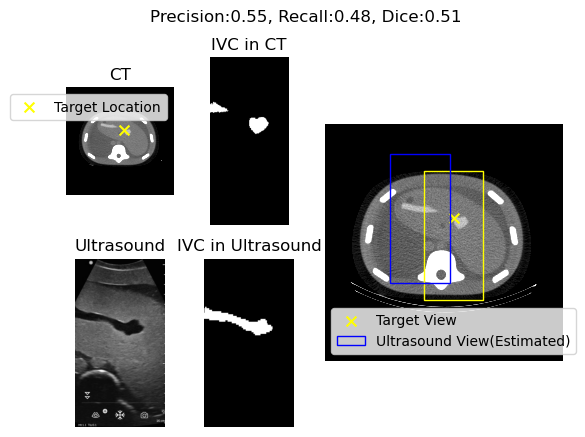

<Figure size 1500x600 with 0 Axes>

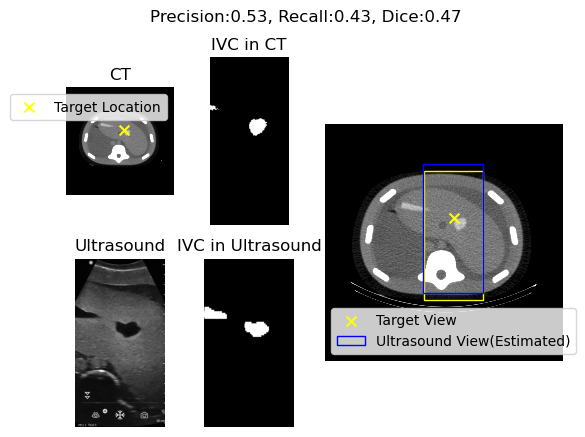

<Figure size 1500x600 with 0 Axes>

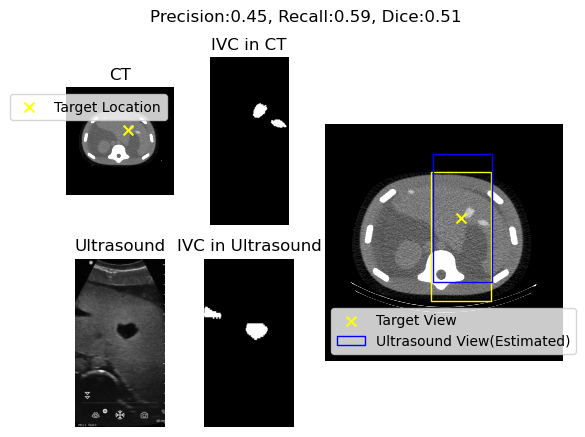

<Figure size 1500x600 with 0 Axes>

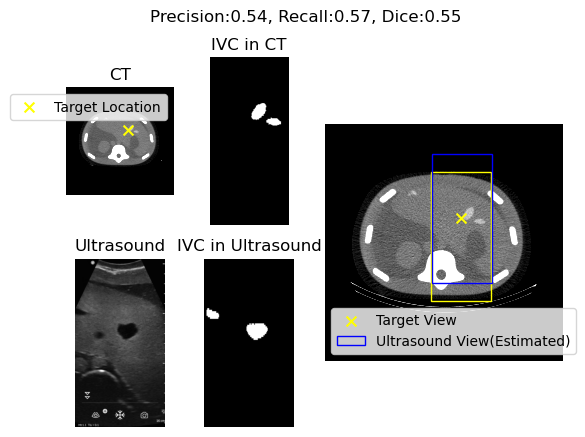

<Figure size 1500x600 with 0 Axes>

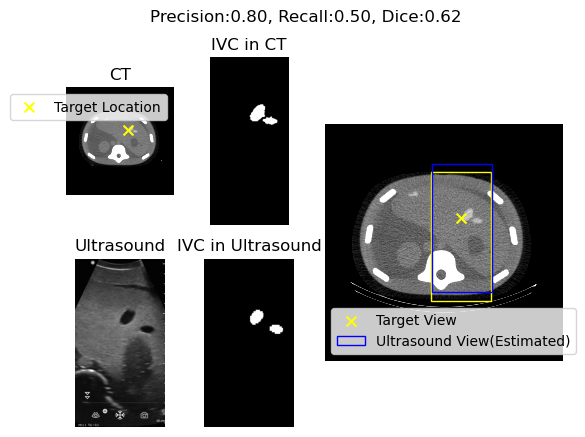

<Figure size 1500x600 with 0 Axes>

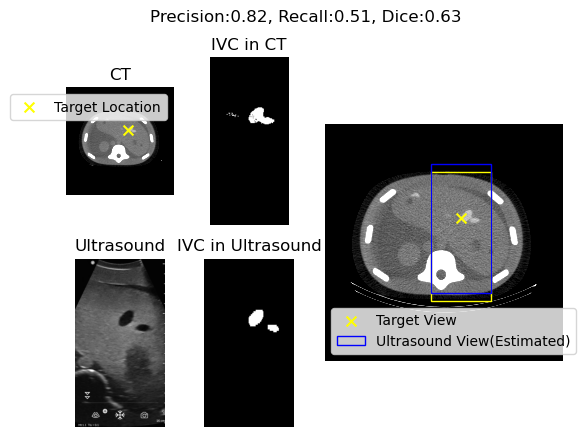

<Figure size 1500x600 with 0 Axes>

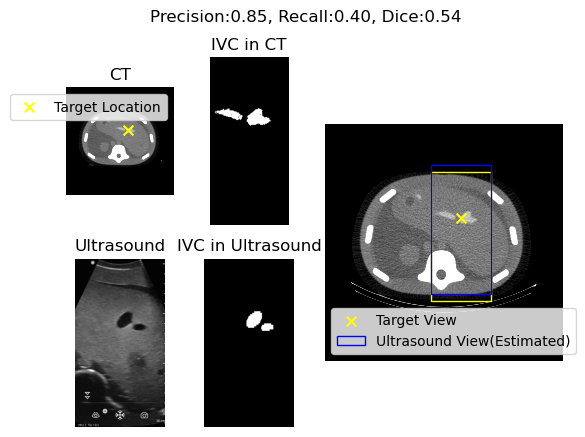

<Figure size 1500x600 with 0 Axes>

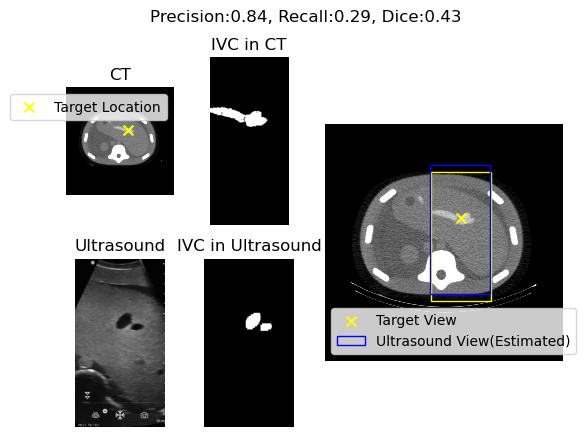

<Figure size 1500x600 with 0 Axes>

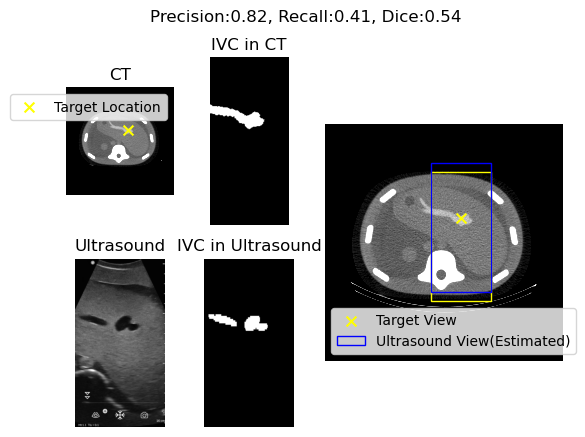

<Figure size 1500x600 with 0 Axes>

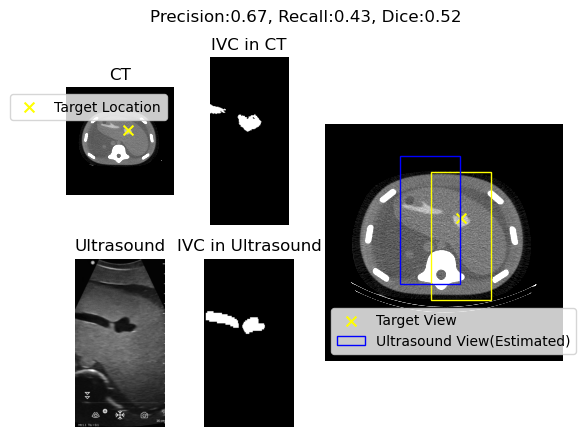

<Figure size 1500x600 with 0 Axes>

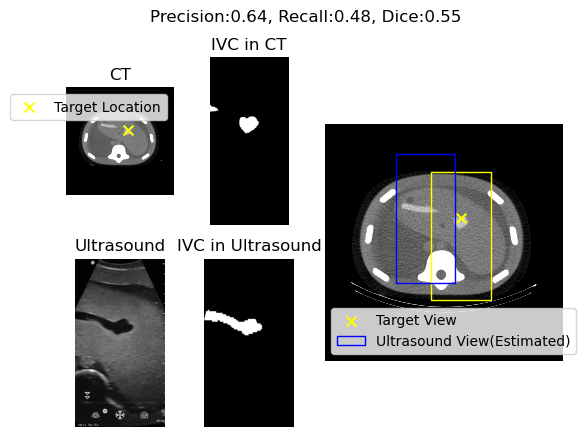

<Figure size 1500x600 with 0 Axes>

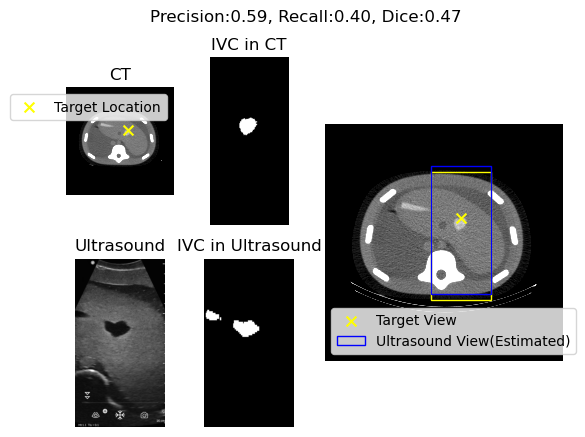

<Figure size 1500x600 with 0 Axes>

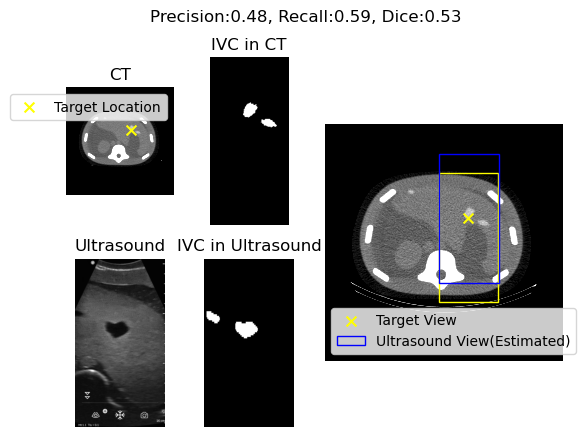

<Figure size 1500x600 with 0 Axes>

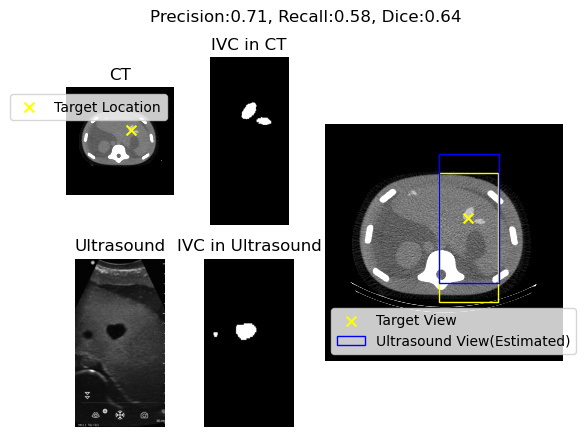

<Figure size 1500x600 with 0 Axes>

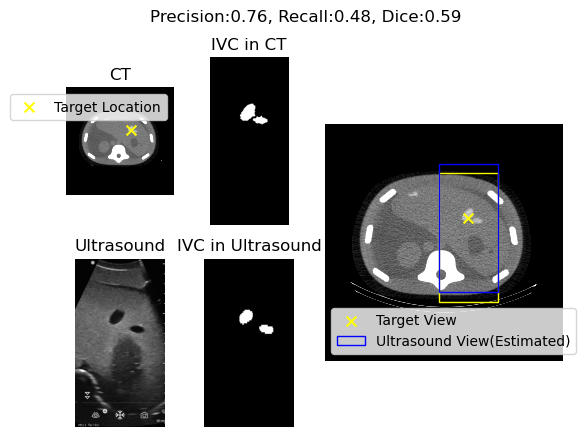

<Figure size 1500x600 with 0 Axes>

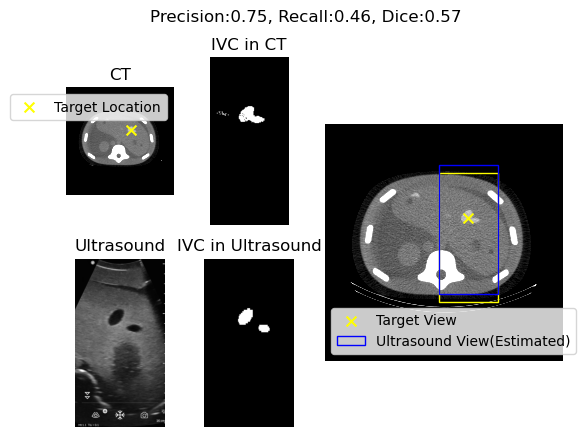

<Figure size 1500x600 with 0 Axes>

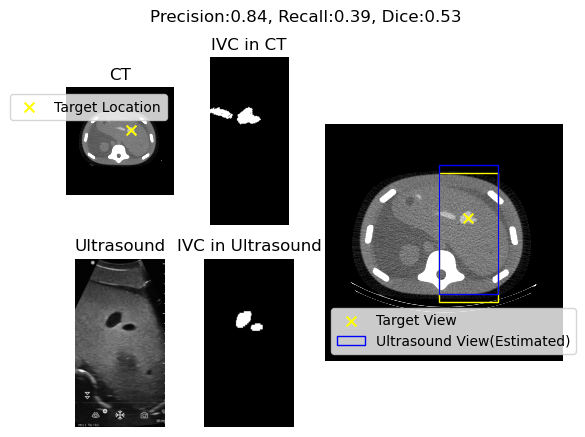

<Figure size 1500x600 with 0 Axes>

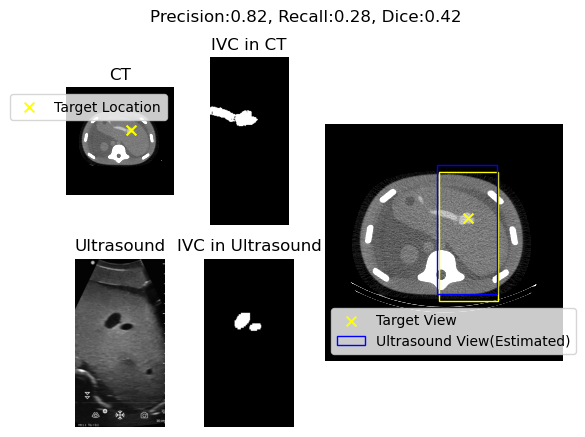

<Figure size 1500x600 with 0 Axes>

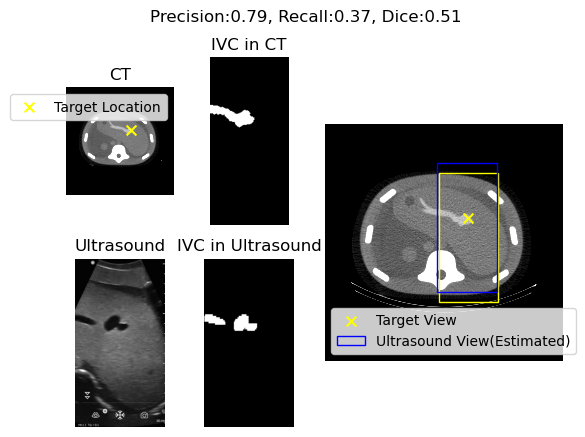

<Figure size 1500x600 with 0 Axes>

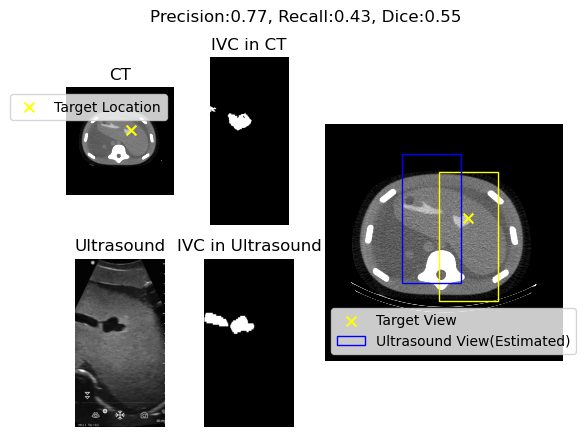

<Figure size 1500x600 with 0 Axes>

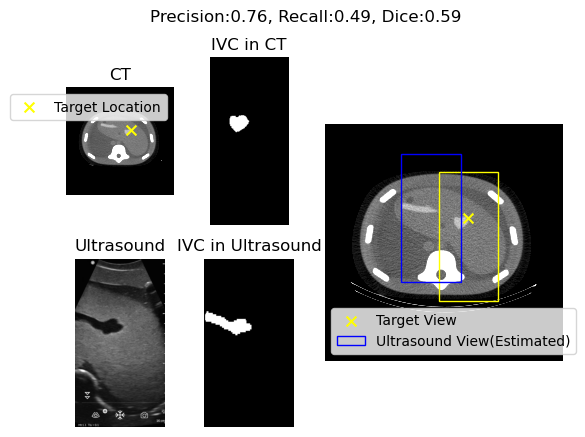

<Figure size 1500x600 with 0 Axes>

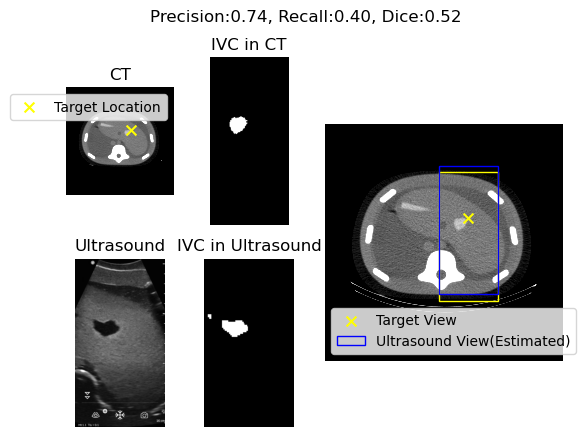

IndexError: list index out of range

In [32]:

for i in range(len(frames)):

    loc = target_locs[i]
    frame = frames[i]
    pred_mask = bunny_mask_predict(vessel_model,frame,device)
   
    pix = body_ct.TransformPhysicalPointToIndex(loc)
       # Standardize the resolution for US and CT vessel slice images.b
    vessel_ct_slice = get_slice_at(vessel_ct,pix)
    vessel_ct_slice = sitk.GetImageFromArray(vessel_ct_slice)
    vessel_ct_slice.SetSpacing(vessel_ct.GetSpacing()[:2])
  

    vessel_us_slice = pred_mask.T
    vessel_us_slice = sitk.GetImageFromArray(vessel_us_slice)
    vessel_us_slice.SetSpacing([xspacing,yspacing])

    h,w = np.array(vessel_us_slice.GetSize())*np.array(vessel_us_slice.GetSpacing())/np.array(vessel_ct_slice.GetSpacing())
  

    plt.figure(figsize=(15,6))

    fig, axs = plt.subplots(ncols=4, nrows=2)

    ax = axs[0,0]
    visualize_body(body_ct,pix,'Target Location',vmin=0.6,vmax=0.8,ax=ax)
    ax.set_title("CT")
    ax.legend()

    ax = axs[0,1]
    vessel_box = getVesselBox(body_ct,vessel_ct,pix,w,h)
    ax.imshow(vessel_box,cmap='gray')
    ax.axis('off')
    ax.set_title("IVC in CT")


    ax = axs[1,0]
    ax.axis('off')
    ax.imshow(to_grayscale(frame[100:1040]),cmap = 'gray')
    ax.set_title('Ultrasound')

    ax = axs[1,1]
    ax.axis('off')
    ax.imshow(pred_mask[100:1040],cmap = 'gray')
    ax.set_title('IVC in Ultrasound')

    gs = axs[0, 2].get_gridspec()
    # remove the underlying axes
    for ax in axs[:, 2:].ravel():
        ax.remove()
    ax = fig.add_subplot(gs[0:, 2:])


  
    # pos,am = global_match(vessel_ct_slice,vessel_us_slice)
    precision, recall, dice,pos = segmentation_scores(vessel_ct_slice,vessel_us_slice)

    visualize_body(body_ct,pix,'Target View',vmin=0.6,vmax=0.8,ax=ax)
    
   
    _,l,t = getTargetBox(body_ct,pix,w,h)
    draw_us_box(ax,l,t,w,h,c='yellow')
    draw_us_box(ax,pos[1]+w/2,pos[0],w,h,c='blue',label='Ultrasound View(Estimated)')
    ax.legend()

    plt.suptitle("Precision:{:.2f}, Recall:{:.2f}, Dice:{:.2f}".format(precision, recall, dice))
    plt.show()




(0.93072337, 0.37368169198504875, 0.5332611638609038)

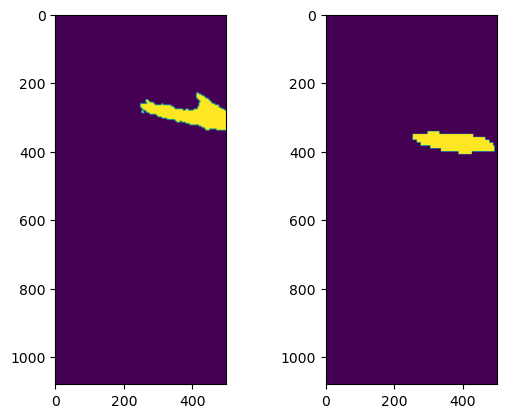

In [26]:

vb = cv2.resize(vessel_box,pred_mask.T.shape)
plt.subplot(1,2,1)
plt.imshow(vb)
plt.subplot(1,2,2)
plt.imshow(pred_mask)
segmentation_scores(vessel_ct_slice,vessel_us_slice)